# Food Delivery Prediction

## Importar

In [24]:
pip install plotly

In [25]:
# Importar librerías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [26]:
import plotly.express as px

In [27]:
import seaborn as sns

In [28]:
import plotly.graph_objects as go

In [29]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVR

## Cargar datos

In [30]:
#Dataset
data=pd.read_csv('deliverytime.txt')
data.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Type_of_order,Type_of_vehicle,Time_taken(min)
0,4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,Snack,motorcycle,24
1,B379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,Snack,scooter,33
2,5D6D,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,Drinks,motorcycle,26
3,7A6A,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,Buffet,motorcycle,21
4,70A2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,Snack,scooter,30


## Tratamiento y limpieza de datos

In [31]:
data.shape

(45593, 11)

In [32]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45593 non-null  object 
 1   Delivery_person_ID           45593 non-null  object 
 2   Delivery_person_Age          45593 non-null  int64  
 3   Delivery_person_Ratings      45593 non-null  float64
 4   Restaurant_latitude          45593 non-null  float64
 5   Restaurant_longitude         45593 non-null  float64
 6   Delivery_location_latitude   45593 non-null  float64
 7   Delivery_location_longitude  45593 non-null  float64
 8   Type_of_order                45593 non-null  object 
 9   Type_of_vehicle              45593 non-null  object 
 10  Time_taken(min)              45593 non-null  int64  
dtypes: float64(5), int64(2), object(4)
memory usage: 3.8+ MB


In [33]:
#data.describe()
data.describe(exclude=np.number)

,ID,Delivery_person_ID,Type_of_order,Type_of_vehicle
count,45593,45593,45593,45593
unique,45451,1320,4,4
top,7E+08,PUNERES01DEL01,Snack,motorcycle
freq,3,67,11533,26435


In [34]:
data.describe()

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min)
count,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000
mean,29.544075,4.632367,17.017729,70.231332,17.465186,70.845702,26.294607
std,5.696793,0.327708,8.185109,22.883647,7.335122,21.118812,9.383806
min,15.000000,1.000000,-30.905562,-88.366217,0.010000,0.010000,10.000000
25%,25.000000,4.600000,12.933284,73.170000,12.988453,73.280000,19.000000
50%,29.000000,4.700000,18.546947,75.898497,18.633934,76.002574,26.000000
75%,34.000000,4.800000,22.728163,78.044095,22.785049,78.107044,32.000000
max,50.000000,6.000000,30.914057,88.433452,31.054057,88.563452,54.000000


In [35]:
#Calcular la cantidad de nulos por columnas
data.isnull().sum()

ID                             0
Delivery_person_ID             0
Delivery_person_Age            0
Delivery_person_Ratings        0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Type_of_order                  0
Type_of_vehicle                0
Time_taken(min)                0
dtype: int64

In [36]:
#Calcular la cantidad de nulos por columnas
data.isna().sum()

ID                             0
Delivery_person_ID             0
Delivery_person_Age            0
Delivery_person_Ratings        0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Type_of_order                  0
Type_of_vehicle                0
Time_taken(min)                0
dtype: int64

## Crear nuevos datos

Se aplica la Formula de Haversine para calcular la distancia entre dos puntos geográficos.

Haversine formula: a = sin²(Δφ/2) + cos φ1 ⋅ cos φ2 ⋅ sin²(Δλ/2)

c = 2 ⋅ atan2( √a, √(1−a) )

d = R ⋅ c

Donde φ es latitud, λ es longitud, R es el radio de tierra (radio = 6,371km);
Los ángulos han de estar en radianes

In [37]:
#Radio de la tierra en kilometros
R=6371

#Convertir grados a radianes
def convertir(grados):
    return grados*(np.pi/180)

#Usando formula de Haversine
def calcular(lat_1,lat_2,long_1,long_2):
    #Diferencia de latitudes
    dif_lat=convertir(lat_2-lat_1)

    #Diferencia de longitudes
    dif_long=convertir(long_2-long_1)

    a=np.sin(dif_lat/2)**2+np.cos(convertir(lat_1))*np.cos(convertir(lat_2))*np.sin(dif_long/2)**2
    c=2*np.arctan2(np.sqrt(a), np.sqrt(1-a))
    return R*c

for i in range(len(data)):
    data.loc[i, 'Distance'] = calcular(data.loc[i, 'Restaurant_latitude'],
                                        data.loc[i, 'Delivery_location_latitude'],
                                        data.loc[i, 'Restaurant_longitude'],
                                        data.loc[i, 'Delivery_location_longitude'])

In [38]:
data.iloc[:,4:]

,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Type_of_order,Type_of_vehicle,Time_taken(min),Distance
0,22.745049,75.892471,22.765049,75.912471,Snack,motorcycle,24,3.025149
1,12.913041,77.683237,13.043041,77.813237,Snack,scooter,33,20.183530
2,12.914264,77.678400,12.924264,77.688400,Drinks,motorcycle,26,1.552758
3,11.003669,76.976494,11.053669,77.026494,Buffet,motorcycle,21,7.790401
4,12.972793,80.249982,13.012793,80.289982,Snack,scooter,30,6.210138
...,...,...,...,...,...,...,...,...
45588,26.902328,75.794257,26.912328,75.804257,Meal,motorcycle,32,1.489846
45589,0.000000,0.000000,0.070000,0.070000,Buffet,motorcycle,36,11.007735
45590,13.022394,80.242439,13.052394,80.272439,Drinks,scooter,16,4.657195
45591,11.001753,76.986241,11.041753,77.026241,Snack,motorcycle,26,6.232393


## Análisis de correlación

In [39]:
corr_matrix=data.corr().round(2)
corr_matrix

<ipython-input-39-44c1ae3a51ff>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix=data.corr().round(2)


,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min),Distance
Delivery_person_Age,1.00,-0.07,-0.00,-0.01,0.00,-0.00,0.29,0.01
Delivery_person_Ratings,-0.07,1.00,-0.00,-0.01,-0.01,-0.01,-0.33,-0.01
Restaurant_latitude,-0.00,-0.00,1.00,0.66,0.87,0.60,0.01,-0.37
Restaurant_longitude,-0.01,-0.01,0.66,1.00,0.63,0.92,0.01,-0.35
Delivery_location_latitude,0.00,-0.01,0.87,0.63,1.00,0.69,0.01,0.03
Delivery_location_longitude,-0.00,-0.01,0.60,0.92,0.69,1.00,0.01,0.03
Time_taken(min),0.29,-0.33,0.01,0.01,0.01,0.01,1.00,-0.00
Distance,0.01,-0.01,-0.37,-0.35,0.03,0.03,-0.00,1.00


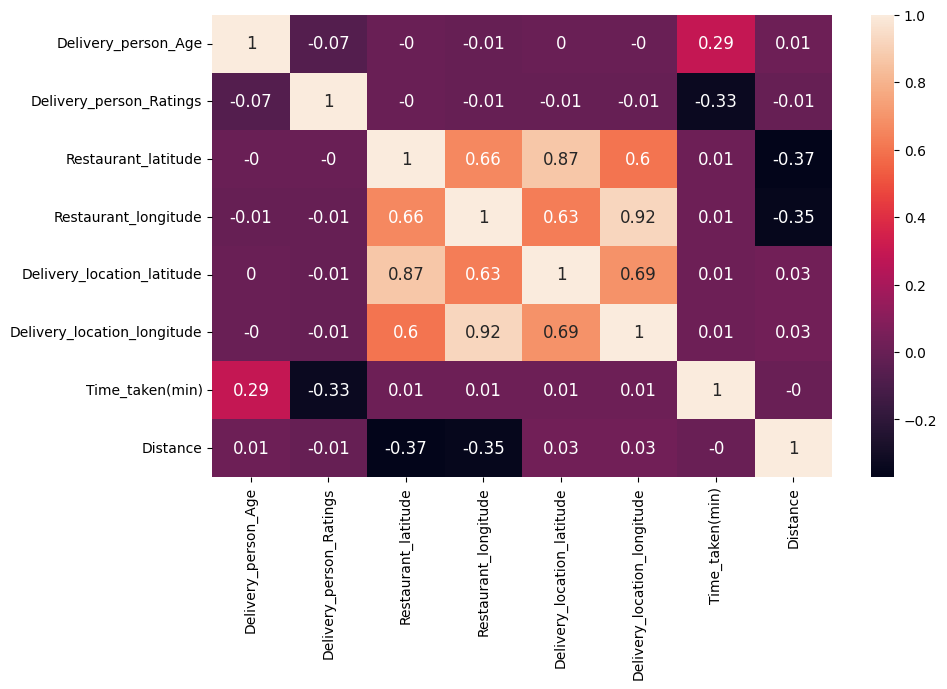

In [40]:
plt.figure(figsize=(10,6))
sns.heatmap(data=corr_matrix,annot=True, annot_kws={'size': 12})
plt.show()

## EDA

In [41]:
#df= px.data.tips()
fig = px.violin(data, y="Time_taken(min)", x="Type_of_order", color="Type_of_order", box=True, hover_data=data.columns)
fig.show()

In [42]:
fig = px.violin(data, y="Time_taken(min)", x="Type_of_vehicle", color="Type_of_vehicle", box=True, hover_data=data.columns)
fig.show()

In [43]:
fig = px.box(data, x="Type_of_vehicle", y="Time_taken(min)", color="Type_of_order")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

In [44]:
figure = px.scatter(data_frame = data,
                    y="Time_taken(min)",
                    x="Delivery_person_Ratings",
                    color='Time_taken(min)',
                    trendline="ols",
                    title = "Relacion entre la distancia y el Rating de delivery por persona")
figure.show()

In [45]:
figure = px.scatter(data_frame = data,
                    y="Delivery_person_Ratings",
                    x="Delivery_person_Age",
                    color='Delivery_person_Age',
                    trendline="ols",
                    title = "Relacion entre edad delivery y tiempo")
figure.show()

In [46]:
figure = px.scatter(data_frame = data,
                    y="Time_taken(min)",
                    x="Delivery_person_Age",
                    color='Time_taken(min)',
                    trendline="ols",
                    title = "Relacion entre edad delivery y tiempo")
figure.show()

In [47]:
#Aplicar metodo one hot para convertir variables categoricas a numericas
data

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Type_of_order,Type_of_vehicle,Time_taken(min),Distance
0,4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,Snack,motorcycle,24,3.025149
1,B379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,Snack,scooter,33,20.183530
2,5D6D,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,Drinks,motorcycle,26,1.552758
3,7A6A,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,Buffet,motorcycle,21,7.790401
4,70A2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,Snack,scooter,30,6.210138
...,...,...,...,...,...,...,...,...,...,...,...,...
45588,7C09,JAPRES04DEL01,30,4.8,26.902328,75.794257,26.912328,75.804257,Meal,motorcycle,32,1.489846
45589,D641,AGRRES16DEL01,21,4.6,0.000000,0.000000,0.070000,0.070000,Buffet,motorcycle,36,11.007735
45590,4F8D,CHENRES08DEL03,30,4.9,13.022394,80.242439,13.052394,80.272439,Drinks,scooter,16,4.657195
45591,5EEE,COIMBRES11DEL01,20,4.7,11.001753,76.986241,11.041753,77.026241,Snack,motorcycle,26,6.232393


In [48]:
orden=pd.get_dummies(data.iloc[:,8], drop_first=False)
orden

,Buffet,Drinks,Meal,Snack
0,0,0,0,1
1,0,0,0,1
2,0,1,0,0
3,1,0,0,0
4,0,0,0,1
...,...,...,...,...
45588,0,0,1,0
45589,1,0,0,0
45590,0,1,0,0
45591,0,0,0,1


In [49]:
vehiculo=pd.get_dummies(data.iloc[:,9], drop_first=False)
vehiculo

,bicycle,electric_scooter,motorcycle,scooter
0,0,0,1,0
1,0,0,0,1
2,0,0,1,0
3,0,0,1,0
4,0,0,0,1
...,...,...,...,...
45588,0,0,1,0
45589,0,0,1,0
45590,0,0,0,1
45591,0,0,1,0


## SVM

In [50]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 12 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45593 non-null  object 
 1   Delivery_person_ID           45593 non-null  object 
 2   Delivery_person_Age          45593 non-null  int64  
 3   Delivery_person_Ratings      45593 non-null  float64
 4   Restaurant_latitude          45593 non-null  float64
 5   Restaurant_longitude         45593 non-null  float64
 6   Delivery_location_latitude   45593 non-null  float64
 7   Delivery_location_longitude  45593 non-null  float64
 8   Type_of_order                45593 non-null  object 
 9   Type_of_vehicle              45593 non-null  object 
 10  Time_taken(min)              45593 non-null  int64  
 11  Distance                     45593 non-null  float64
dtypes: float64(6), int64(2), object(4)
memory usage: 4.2+ MB


In [51]:
from sklearn.preprocessing import LabelEncoder

In [52]:
# Crear una instancia de LabelEncoder
label_encoder = LabelEncoder()

# Ajustar y transformar la columna "Type_of_vehicle"
data['Type_of_vehicle'] = label_encoder.fit_transform(data['Type_of_vehicle'])
data['Type_of_order'] = label_encoder.fit_transform(data['Type_of_order'])

# Imprimir el resultado
data.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Type_of_order,Type_of_vehicle,Time_taken(min),Distance
0,4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,3,2,24,3.025149
1,B379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,3,3,33,20.183530
2,5D6D,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,1,2,26,1.552758
3,7A6A,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,0,2,21,7.790401
4,70A2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,3,3,30,6.210138


In [56]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR

# Seleccionar características y objetivo
X = data[['Delivery_person_Age', 'Delivery_person_Ratings', 'Distance', 'Type_of_order', 'Type_of_vehicle']]
y = data['Time_taken(min)']

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Renombrar las columnas del conjunto de datos de prueba
X_test.columns = X_train.columns

# Escalar características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train.values)
X_test_scaled = scaler.transform(X_test.values)

# Entrenar el modelo SVM
svm_model = SVR()
svm_model.fit(X_train_scaled, y_train)

# Ingresar inputs para realizar la predicción
inputs = []
#for i in range(5):
#    value = float(input(f"Ingrese el valor para el input {i+1}: "))
#    inputs.append(value)
print('INGRESE LOS SIGUIENTES DATOS:')
print('____________________________________________')
value = float(input(f"Edad del repartidor: "))
inputs.append(value)
value = float(input(f"Raiting del repartidor: "))
inputs.append(value)
value = float(input(f"Distancia hacia el lugar de entrega: "))
inputs.append(value)
value = float(input(f"Número según el tipo de orden: "))
inputs.append(value)
value = float(input(f"Número según el tipo de vehiculo: "))
inputs.append(value)
# Realizar la predicción con los inputs proporcionados
ejemplo = [inputs]
ejemplo_scaled = scaler.transform(ejemplo)
tiempo_estimado = svm_model.predict(ejemplo_scaled)
print('____________________________________________')
print("Tiempo estimado de entrega:", tiempo_estimado[0], "minutos")


INGRESE LOS SIGUIENTES DATOS:
____________________________________________
Edad del repartidor: 20
Raiting del repartidor: 5
Distancia hacia el lugar de entrega: 14
Número según el tipo de orden: 1
Número según el tipo de vehiculo: 2
____________________________________________
Tiempo estimado de entrega: 23.613956990642752 minutos
